In [11]:
import zipfile
z = zipfile.ZipFile('/content/Blood_Cell_Image_Segmentation_Datasets.zip')
z.extractall()

In [12]:
!pip install segmentation-models-pytorch

In [ ]:
import torch
import torchvision.models.segmentation as models
import os
import cv2
import numpy as np
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import random
import matplotlib.pyplot as plt

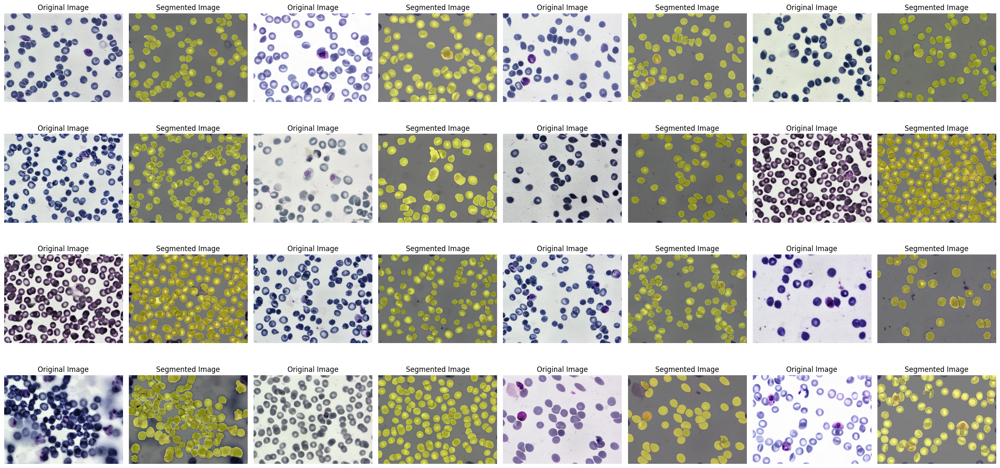

In [ ]:
# Directories
images_dir = "Blood_Cell_Image_Segmentation_Datasets/train/images"
images_mask = "Blood_Cell_Image_Segmentation_Datasets/train/masks"
images = os.listdir(images_dir)

# Create a grid for visualization (4 rows, 8 columns)
fig, ax = plt.subplots(4, 8, figsize=(24, 12))
ax = ax.ravel()

# Define transparency level (0 to 1)
alpha = 0.5  # 50% transparency

# Define class colors
class_colors = {
    1: [255, 255, 0],  # Yellow for Blood Cell
}

for i in range(16):
    # Randomly select an image
    img = random.choice(images)
    img_path = os.path.join(images_dir, img)
    mask_path = os.path.join(images_mask, img[:-4]+'.png')

    # Load image
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Load mask (grayscale)
    mask = cv2.imread(mask_path, 0)  # Single-channel grayscale mask
    # print(mask[mask > 0])
    mask[mask > 0] = 1  # Convert any non-zero values to 1

    # Create an overlay with the same shape as the image
    overlay = np.zeros_like(image)

    for class_id, color in class_colors.items():  # Loop through class 1
        class_mask = (mask == class_id)           # 2D boolean mask where mask == 1
        for c in range(3):        
            overlay[..., c][class_mask] = color[c]

    # Blend the original image and the overlay using alpha
    # blended_image = cv2.addWeighted(image, 1 - alpha, overlay, alpha, 0) # blended = 0.5 * image + 0.5 * overlay
    
    # Create a copy to preserve original image
    blended_image = image.copy()

    # Where mask == 1, blend
    for c in range(3):  # For each color channel
        blended_image[..., c][mask == 1] = (
            image[..., c][mask == 1] * (1 - alpha) + 
            overlay[..., c][mask == 1] * alpha
        ).astype(np.uint8)

    # Display the original image
    ax[2*i].imshow(image)
    ax[2*i].set_title("Original Image")
    ax[2*i].axis("off")

    # Display the mask overlayed on the image
    ax[2*i + 1].imshow(blended_image)
    ax[2*i + 1].set_title("Segmented Image")
    ax[2*i + 1].axis("off")

plt.tight_layout()
plt.show()


In [15]:
# Check for GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


# Define class names and their corresponding colors
class_names = ["Background", "Blood Cell"]

# Check for GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.fcn_resnet50(pretrained=True)
model.classifier[4] = torch.nn.Conv2d(512, len(class_names), kernel_size=(1,1))
model.aux_classifier = None  # Disable auxiliary classifier

# Move model to GPU if available
model = model.to(device)

print("Model is ready for binary segmentation (BG & Person) using U-Net with ResNet34.")


Using device: cuda


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FCN_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=FCN_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fcn_resnet50_coco-1167a1af.pth" to /root/.cache/torch/hub/checkpoints/fcn_resnet50_coco-1167a1af.pth
100%|██████████| 135M/135M [00:01<00:00, 88.0MB/s]


Model is ready for binary segmentation (BG & Person) using U-Net with ResNet34.


In [16]:
class BloodCellSegmentationDataset(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.image_filenames = sorted(os.listdir(images_dir))
        self.mask_filenames = sorted(os.listdir(masks_dir))
        self.transform = transform

        # Define class labels (only Background and Person)
        self.class_labels = {
            0: "Background",
            1: "Blood Cell"
        }

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        image_path = os.path.join(self.images_dir, self.image_filenames[idx])
        mask_path = os.path.join(self.masks_dir, self.mask_filenames[idx])

        # Load image and convert to RGB
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Load mask in grayscale mode
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # Ensure mask values are either 0 (Background) or 1 (Person)
        mask = np.where(mask > 0, 1, 0).astype(np.uint8)

        # Apply transformations if provided
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image, mask = augmented['image'], augmented['mask']


        return image, torch.tensor(mask, dtype=torch.long)


In [18]:
transform = A.Compose([
    A.Resize(224, 224),  # Resize image to 224x224
    A.HorizontalFlip(p=0.5),  # Random horizontal flip
    A.VerticalFlip(p=0.2),  # Random vertical flip
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=30, p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    A.GaussianBlur(blur_limit=(3, 5), p=0.3),  # Random blurring
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

# Directories
train_images_dir = "Blood_Cell_Image_Segmentation_Datasets/train/images"
train_images_mask = "Blood_Cell_Image_Segmentation_Datasets/train/masks"

# Load dataset
train_dataset = BloodCellSegmentationDataset(train_images_dir, train_images_mask, transform=transform)

# DataLoader for training and validation
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, drop_last=True)

# Define Loss and Optimizer
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)


In [19]:
print(len(train_loader))
print(len(train_dataset))

146
1169


<ipython-input-16-8a1520aaad41>:38: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return image, torch.tensor(mask, dtype=torch.long)


[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]


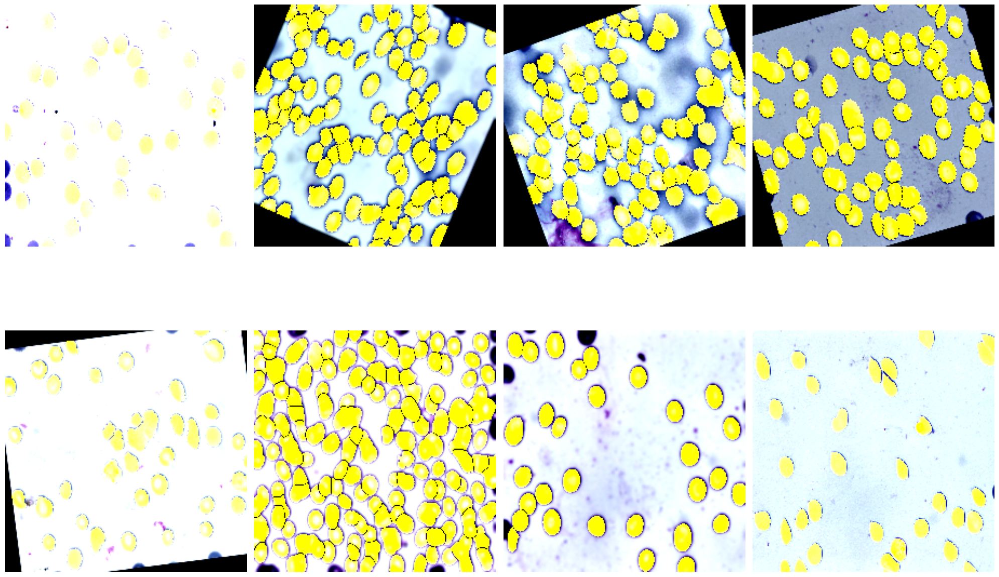

In [ ]:
# Define transparency level (0 to 1)
alpha = 0.5 # 50% transparency

# Define class names and their corresponding colors
class_names = ["BG", "Blood Cell"]
class_colors = {
    1: [255, 255, 0],  # Yellow for Person
}

# Get a random batch from the DataLoader
random_batch_index = random.randint(0, len(train_loader) - 1)

# Iterate through the DataLoader to get the random batch
for batch_idx, (images, masks) in enumerate(train_loader):
    if batch_idx == random_batch_index:
        fig, ax = plt.subplots(2, 4, figsize=(20, 15))
        ax = ax.ravel()

        for i in range(8):
            image = images[i].permute(1, 2, 0).cpu().numpy()
            mask = masks[i].cpu().numpy()

            print(mask[mask > 0])

            overlay = np.zeros_like(image)
            
            for class_id, color in class_colors.items():  # Loop through class 1
                class_mask = (mask == class_id)           # 2D boolean mask where mask == 1
                for c in range(3):        
                    overlay[..., c][class_mask] = color[c]
            
            # Create a copy to preserve original image
            blended_image = image.copy()

            # Where mask == 1, blend
            for c in range(3):  # For each color channel
                blended_image[..., c][mask == 1] = (
                    image[..., c][mask == 1] * (1 - alpha) + 
                    overlay[..., c][mask == 1] * alpha
                ).astype(np.uint8)
                
            ax[i].imshow(blended_image)
            ax[i].axis("off")

        plt.tight_layout()
        plt.show()
        break



In [21]:
# Initialize best loss as a large number
best_loss = float("inf")
save_path = "best_model.pth"  # Path to save the best model

EPOCHS = 50

for epoch in range(EPOCHS):
    model.train()
    epoch_loss = 0

    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)['out']
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    avg_epoch_loss = epoch_loss / len(train_loader)  # Average loss per epoch
    print(f"\nEpoch [{epoch+1}/{EPOCHS}], Loss: {avg_epoch_loss:.4f}")

    # Save the model if it has the lowest loss so far
    if avg_epoch_loss < best_loss:
        best_loss = avg_epoch_loss
        torch.save(model.state_dict(), save_path)
        print(f"✅ Model saved with loss {best_loss:.4f}")

print(f"🎉 Training complete! Best model saved at: {save_path}")


<ipython-input-16-8a1520aaad41>:38: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return image, torch.tensor(mask, dtype=torch.long)



Epoch [1/50], Loss: 0.2566
✅ Model saved with loss 0.2566

Epoch [2/50], Loss: 0.1628
✅ Model saved with loss 0.1628

Epoch [3/50], Loss: 0.1516
✅ Model saved with loss 0.1516

Epoch [4/50], Loss: 0.1440
✅ Model saved with loss 0.1440

Epoch [5/50], Loss: 0.1428
✅ Model saved with loss 0.1428

Epoch [6/50], Loss: 0.1369
✅ Model saved with loss 0.1369

Epoch [7/50], Loss: 0.1351
✅ Model saved with loss 0.1351

Epoch [8/50], Loss: 0.1340
✅ Model saved with loss 0.1340

Epoch [9/50], Loss: 0.1336
✅ Model saved with loss 0.1336

Epoch [10/50], Loss: 0.1352

Epoch [11/50], Loss: 0.1315
✅ Model saved with loss 0.1315

Epoch [12/50], Loss: 0.1284
✅ Model saved with loss 0.1284

Epoch [13/50], Loss: 0.1269
✅ Model saved with loss 0.1269

Epoch [14/50], Loss: 0.1263
✅ Model saved with loss 0.1263

Epoch [15/50], Loss: 0.1264

Epoch [16/50], Loss: 0.1256
✅ Model saved with loss 0.1256

Epoch [17/50], Loss: 0.1249
✅ Model saved with loss 0.1249

Epoch [18/50], Loss: 0.1234
✅ Model saved with los

C:\Users\dell\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\dell\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


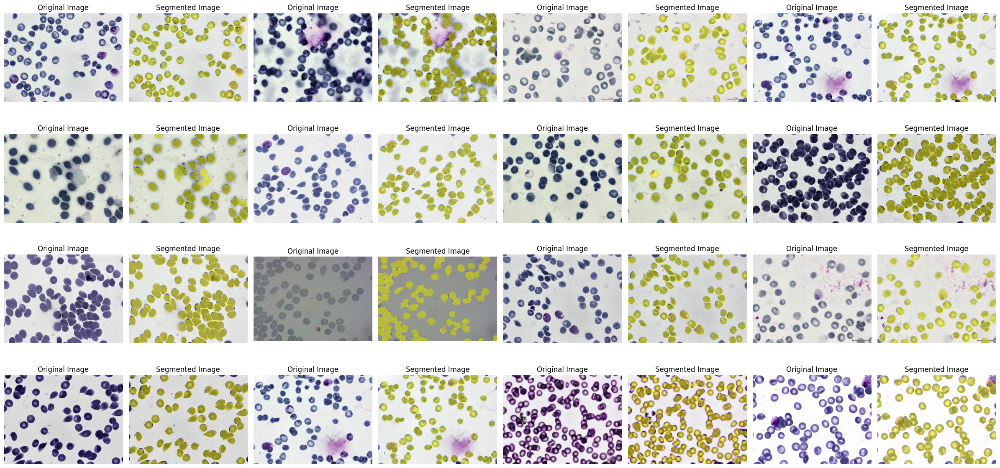

In [4]:
import cv2
import random
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
import torchvision.transforms as T
from torchvision.models.segmentation import fcn_resnet50
from PIL import Image
import segmentation_models_pytorch as smp  # Make sure SMP is installed

# Load the trained model
model_path = "blood_cell.pth"  # Path to your trained model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the pretrained model and modify the classifier
model = fcn_resnet50(pretrained=False)
model.classifier[4] = torch.nn.Conv2d(512, 2, kernel_size=(1, 1))
model.aux_classifier = None

# Move model to the device BEFORE loading weights
model.to(device)

# Load model weights
state_dict = torch.load(model_path, map_location=device)
model.load_state_dict(state_dict)

# Directories
images_dir = "Blood_Cell_Image_Segmentation_Datasets/test/images"
images = os.listdir(images_dir)

# Create a grid for visualization (4 rows, 8 columns)
fig, ax = plt.subplots(4, 8, figsize=(24, 12))
ax = ax.ravel()

# Define transparency level (0 to 1)
alpha = 0.5  # 50% transparency

# Class definitions (Background & Leaf)
class_colors = {
    1: [255, 255, 0]  # Leaf (Yellow)
}

# ✅ Fixed: Correct preprocessing order
transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),  # Convert PIL to Tensor FIRST ✅
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize AFTER ToTensor ✅
])

for i in range(16):
    # Randomly select an image
    img = random.choice(images)
    img_path = os.path.join(images_dir, img)

    # Load image and convert to RGB
    image = Image.open(img_path).convert("RGB")  # ✅ Ensure RGB format

    # Apply model transformations
    input_tensor = transform(image).unsqueeze(0).to(device)  # ✅ Now correctly formatted

    # Model Prediction
    with torch.no_grad():
        output = model(input_tensor)['out'][0]  # Get model output

    predicted_mask = torch.argmax(output, dim=0).cpu().numpy()

    # ✅ Fixed: Convert PIL image to NumPy before resizing
    image_np = np.array(image)  # Convert PIL to NumPy

    # ✅ Fixed: Use `.size` instead of `.shape` for PIL
    original_width, original_height = image.size

    # Resize predicted mask to match original image size
    mask = cv2.resize(predicted_mask, (original_width, original_height), interpolation=cv2.INTER_NEAREST)

    # Create a colored overlay of the same shape as the image
    overlay = np.zeros_like(image_np, dtype=np.uint8)
    
    for class_id, color in class_colors.items():  # Loop through class 1
        class_mask = (mask == class_id)           # 2D boolean mask where mask == 1
        for c in range(3):        
            overlay[..., c][class_mask] = color[c]
    
    # Create a copy to preserve original image
    blended_image = image_np.copy()

    # Where mask == 1, blend
    for c in range(3):  # For each color channel
        blended_image[..., c][mask == 1] = (
            image_np[..., c][mask == 1] * (1 - alpha) + 
            overlay[..., c][mask == 1] * alpha
        ).astype(np.uint8)

    # Display the original image
    ax[2*i].imshow(image_np)
    ax[2*i].set_title("Original Image")
    ax[2*i].axis("off")

    # Display the segmented image
    ax[2*i + 1].imshow(blended_image)
    ax[2*i + 1].set_title("Segmented Image")
    ax[2*i + 1].axis("off")

# Plot and show final grid
plt.tight_layout()
plt.show()
